In [1]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import scipy
import os
from os.path import dirname, join as pjoin
import torch
from torch import nn 
import scipy.signal as signal


# Set data type and device
dtype = torch.float
#device = "cuda" if torch.cuda.is_available() else "cpu"
#print(torch.cuda.is_available())
device = torch.device("cpu")

# Close all open plots
plt.close('all')

In [2]:
# Load data from file
folderpath = os.getcwd()
filepath = pjoin(folderpath, 'input.mat')
data_in = scipy.io.loadmat(filepath)
filepath = pjoin(folderpath, 'output.mat')
data_out = scipy.io.loadmat(filepath)

# Extract data from dictionary
dExp, yExp, dExp_val, yExp_val, time__ = data_in['dExp'], data_out['yExp'], \
    data_in['dExp_val'], data_out['yExp_val'], data_in['time__']
nExp = yExp.size


In [3]:
class SSModel(nn.Module):
    def __init__(self, input_size, state_size, output_size, nExp):
        super(SSModel, self).__init__()
        # Initialize matrices
        self.A = nn.Parameter(torch.randn(state_size, state_size))
        self.B = nn.Parameter(torch.randn(state_size, input_size))
        self.C = nn.Parameter(torch.randn(output_size, state_size))
        self.D = nn.Parameter(torch.randn(output_size, input_size))
        self.F = nn.Parameter(torch.ones(output_size, input_size))
        
        # Apply Xavier initialization to all weight matrices
        torch.nn.init.xavier_uniform_(self.A)
        torch.nn.init.xavier_uniform_(self.B)
        torch.nn.init.xavier_uniform_(self.C)
        torch.nn.init.xavier_uniform_(self.D)
        torch.nn.init.xavier_uniform_(self.F)
        
        # Nonlinear activation function
        self.activation = nn.Tanh() 

        # For each experiment, initialize hidden state
        self.state = torch.zeros(state_size, nExp)

    def forward(self, u):
        """
        u: (nExp, ti, input_size) 
        y: (nExp, ti, output_size)
        """
        nExp, ti, _ = u.shape
        y = torch.zeros(self.C.shape[0], ti,nExp )  # (output_size, ti,nExp )
        
        for t in range(ti):
            u_t = u[:, t, :].T #(nExp, input_size)
            #print(u_t)
            
            #statz
            self.state = self.A @ self.state + self.B @ u_t
            print(self.state)
            #intermediate
            eta_t =  self.C @ self.state +  self.D @ u_t
            #print(eta_t)
            #nonlinearity
            y[:, t, :] = self.activation(eta_t) +  self.F @ u_t
            #print(y)
        return y.T

In [4]:
# Create time vector
#t = np.arange(0, np.size(dExp[0, 0], 1) * Ts, Ts)
t = time__

# Set end time
t_end = t.size

# Initialize input and output tensors
u = torch.zeros(nExp, t_end, 5)
y = torch.zeros(nExp, t_end, 2)

# Set input number
inputnumberD = 4

# Fill input and output tensors with data
for j in range(nExp):
    u[j, :, :] = (torch.from_numpy(dExp[0, j]))
    y[j, :, :] = (torch.from_numpy(yExp[0, j]))
    #u[j, :, 4] = torch.from_numpy(signal.medfilt((u[j, :, 4]).numpy(), 15))            # to smooth the input signal of Qhot (noisy)

# Set random seed for reproducibility
seed = 1
torch.manual_seed(seed)

In [5]:
#Set dimensions for RNN layers
idd = dExp[0, 0].shape[1]
state_dim = 5
odd = yExp[0, 0].shape[1]

# Initialize RNN model
SSM = SSModel(idd, state_dim, odd, nExp)

# Load the model parameters before starting a new training session
#SSM.load_state_dict(torch.load('parameters_SSM.pth'))

# Define loss function
MSE = nn.MSELoss()

# Define optimization method
learning_rate = 1.0e-2
optimizer = torch.optim.Adam(SSM.parameters(), lr=learning_rate)
optimizer.zero_grad()

# Set number of epochs
epochs = 5

# Initialize array to store loss values
LOSS = np.zeros(epochs)


In [6]:
# Train the RNN model
for epoch in range(epochs):
    # Adjust learning rate at certain epochs
    if epoch == epochs - epochs / 2:
        learning_rate = 1.0e-3
        optimizer = torch.optim.Adam(SSM.parameters(), lr=learning_rate)
    if epoch == epochs - epochs / 6:
        learning_rate = 1.0e-4
        optimizer = torch.optim.Adam(SSM.parameters(), lr=learning_rate)
    optimizer.zero_grad()
    loss = 0

    # Get RNN output for training data
    ySSM = SSM(u)
    ySSM = torch.squeeze(ySSM)
    print(ySSM.shape)
    print(ySSM)
    

    # Calculate loss and backpropagate
    loss = MSE(ySSM, y)
    loss.backward()
    optimizer.step()
    

    # Print loss for current epoch
    print(f"Epoch: {epoch + 1} \t||\t Loss: {loss}")
    LOSS[epoch] = loss
    
    # Save model parameters every 15 epochs
    if (epoch + 1) % 15 == 0:
        torch.save(SSM.state_dict(), f'parameters_SSM.pth')
        print(f"Model parameters saved at epoch {epoch + 1}")

tensor([[ 0.8048,  0.8957],
        [-0.5067, -0.5394],
        [ 0.0457,  0.0625],
        [ 0.1650,  0.2062],
        [-0.5296, -0.5684]], grad_fn=<AddBackward0>)
tensor([[ 2.0210,  2.1973],
        [-1.0092, -1.0745],
        [ 0.1819,  0.2474],
        [ 0.5483,  0.6103],
        [-1.2247, -1.3393]], grad_fn=<AddBackward0>)
tensor([[ 3.6147,  3.9339],
        [-1.6414, -1.7218],
        [ 0.6806,  0.7788],
        [ 0.8968,  0.9581],
        [-2.1879, -2.3631]], grad_fn=<AddBackward0>)
tensor([[ 5.9145,  6.4077],
        [-2.1608, -2.2542],
        [ 1.3796,  1.5542],
        [ 1.1819,  1.2722],
        [-3.3434, -3.6103]], grad_fn=<AddBackward0>)
tensor([[ 8.9706,  9.6730],
        [-2.6092, -2.7025],
        [ 2.5887,  2.8715],
        [ 1.4637,  1.5464],
        [-4.8074, -5.1775]], grad_fn=<AddBackward0>)
tensor([[13.0130, 13.9812],
        [-2.8358, -2.8885],
        [ 4.4312,  4.8434],
        [ 1.5523,  1.6247],
        [-6.5744, -7.0544]], grad_fn=<AddBackward0>)
tensor([[1

C:\Users\adela\AppData\Local\Temp\ipykernel_3020\3305755297.py:45: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3701.)
  return y.T


Epoch: 1 	||	 Loss: nan
tensor([[nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan]], grad_fn=<AddBackward0>)
tensor([[nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan]], grad_fn=<AddBackward0>)
tensor([[nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan]], grad_fn=<AddBackward0>)
tensor([[nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan]], grad_fn=<AddBackward0>)
tensor([[nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan]], grad_fn=<AddBackward0>)
tensor([[nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan]], grad_fn=<AddBackward0>)
tensor([[nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan]], grad_fn=<AddBackward0>)
tensor([[nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan],
        [nan, nan]], 

RuntimeError: Trying to backward through the graph a second time (or directly access saved tensors after they have already been freed). Saved intermediate values of the graph are freed when you call .backward() or autograd.grad(). Specify retain_graph=True if you need to backward through the graph a second time or if you need to access saved tensors after calling backward.

In [33]:
# Initialize input and output tensors for validation data
nExp = yExp_val.size
uval = torch.zeros(nExp, t_end, 5)
yval = torch.zeros(nExp, t_end, 2)

# Fill input and output tensors with validation data
for j in range(nExp):
    inputActive = (torch.from_numpy(dExp_val[0, j]))
    uval[j, :, :] = torch.unsqueeze(inputActive[:,inputnumberD], 1)
    yval[j, :, :] = (torch.from_numpy(yExp_val[0, j]))
    #uval[j, :, 4] = torch.from_numpy(signal.medfilt((uval[j, :, 4]).numpy(), 15))

# Get RNN output for validation data
yLTS_val = SSM(uval)
#yLTS_val = yLTS_val.unsqueeze_(0)

# Calculate loss for validation data
loss_val = MSE(yLTS_val, yval)

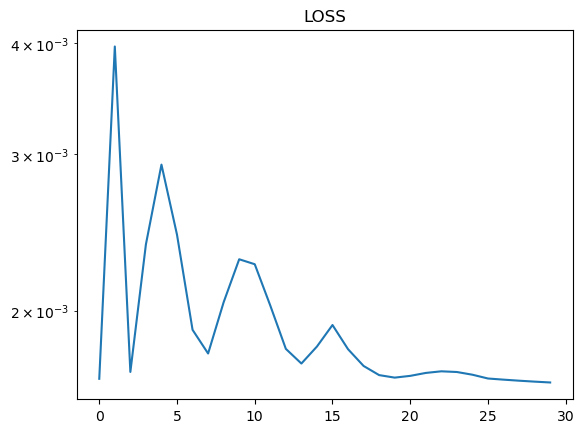

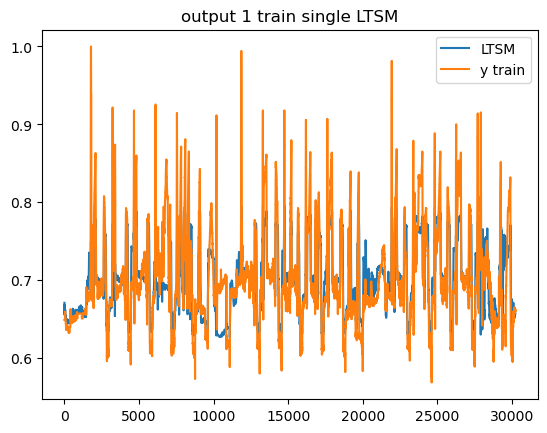

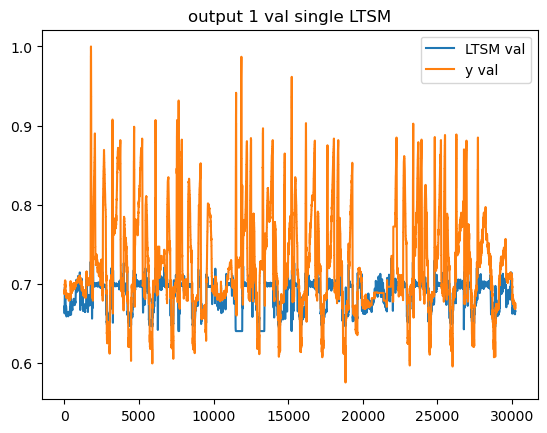

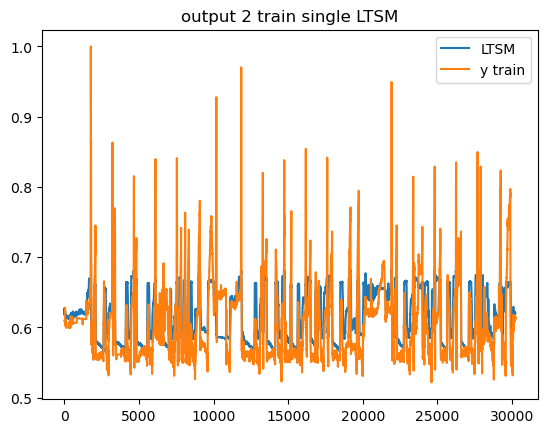

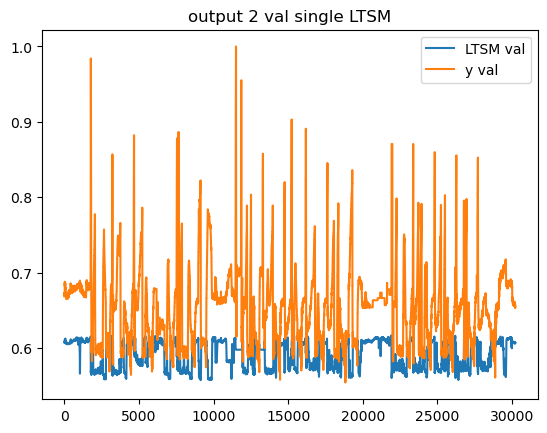

Loss Validation single LTSM: 0.0058512017130851746


In [34]:
# Plot loss over epochs
plt.figure('8')
plt.semilogy(LOSS)
plt.title("LOSS")
plt.show()

#cutting the 10 first points that are difficult to predict because of the starting conditions
# Plot output 1 for training data
plt.figure('9')
plt.plot(yLTS[0, 10:, 0].detach().numpy(), label='SSM')
plt.plot(y[0, 10:, 0].detach().numpy(), label='y train')
plt.title("output 1 train single SSM")
plt.legend()
plt.show()

# Plot output 1 for validation data
plt.figure('10')
plt.plot(yLTS_val[0, 10:, 0].detach().numpy(), label='SSM val')
plt.plot(yval[0, 10:, 0].detach().numpy(), label='y val')
plt.title("output 1 val single SSM")
plt.legend()
plt.show()

# Plot output 2 for training data
plt.figure('11')
plt.plot(yLTS[0, 10:, 1].detach().numpy(), label='SSM')
plt.plot(y[0, 10:, 1].detach().numpy(), label='y train')
plt.title("output 2 train single SSM")
plt.legend()
plt.show()

# Plot output 2 for validation data
plt.figure('12')
plt.plot(yLTS_val[0, 10:, 1].detach().numpy(), label='SSM val')
plt.plot(yval[0, 10:, 1].detach().numpy(), label='y val')
plt.title("output 2 val single SSM")
plt.legend()
plt.show()

# Save RNN output and validation data to file
scipy.io.savemat(os.path.join('data_storage', 'data_singleRNN_sysID_LTSM.mat'), dict(yLTSm_val=yLTS_val.detach().numpy(), yval=yval.detach().numpy()))

# Print validation loss
print(f"Loss Validation single LTSM: {loss_val}")

In [35]:
0.0054 / 0.0058

0.9310344827586208